In [1]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pyvips

# Params
sample_n = 32

# Paths
root = '/media/latlab/MR/projects/kaggle-ubc-ocean'
data_dir = os.path.join(root, 'data')
results_dir = os.path.join(root, 'results')
train_csv = 'train.csv'
train_image_dir = os.path.join(data_dir, 'train_images')
train_thumbnail_dir = os.path.join(data_dir, 'train_thumbnails')
tile_set_name = 'train_tiles_1024_p50_drop60_v6'
tiles_dir = os.path.join(results_dir, tile_set_name)
out_name = tile_set_name

# Load data
df = pd.read_csv(os.path.join(data_dir, train_csv))
df

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
...,...,...,...,...,...
533,65022,LGSC,53355,46675,False
534,65094,MC,55042,45080,False
535,65300,HGSC,75860,27503,False
536,65371,HGSC,42551,41800,False


In [2]:
tiles_df = pd.DataFrame(columns=['image_id', 'orig_image_id', 'label', 'is_tma'])
for i, row in df.iterrows():
    orig_image_id = row['image_id']
    try:
        image_id_list = [os.path.splitext(x)[0] for x in os.listdir(os.path.join(tiles_dir, str(orig_image_id)))]
        curr_df = pd.DataFrame({'image_id': image_id_list, 
                                'orig_image_id': orig_image_id, 
                                'label': row['label'], 
                                'orig_image_width': row['image_width'], 
                                'orig_image_height': row['image_height'], 
                                'is_tma': row['is_tma']})
        tiles_df = pd.concat((tiles_df, curr_df))
    except:
        print(f'No tiles for {orig_image_id}')
tiles_df = tiles_df.reset_index(drop=True).astype({'orig_image_width': 'int32', 'orig_image_height': 'int32'})
tiles_df

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height
0,000309_21504-12288,4,HGSC,False,23785,20008
1,000341_5120-14336,4,HGSC,False,23785,20008
2,000178_10240-7168,4,HGSC,False,23785,20008
3,000234_18432-9216,4,HGSC,False,23785,20008
4,000025_1024-1024,4,HGSC,False,23785,20008
...,...,...,...,...,...,...
447656,000396_36864-8192,65533,HGSC,False,45190,33980
447657,000625_40960-13312,65533,HGSC,False,45190,33980
447658,000733_13312-16384,65533,HGSC,False,45190,33980
447659,000605_20480-13312,65533,HGSC,False,45190,33980


In [3]:
# Check data
tiles_df.groupby('orig_image_id')['image_id'].count().describe()

count     538.000000
mean      832.083643
std       500.938425
min         1.000000
25%       443.250000
50%       746.500000
75%      1129.750000
max      2509.000000
Name: image_id, dtype: float64

In [4]:
tiles_df.to_csv(os.path.join(results_dir, f'{out_name}.csv'), index=False)

In [5]:
# Undersample to N tile/image
def sampler(x, n):
    if len(x) <= n:
        return x
    else:
        return x.sample(n)
tiles_df_sample = tiles_df.groupby('orig_image_id').apply(lambda x: sampler(x, sample_n)).reset_index(drop=True)
tiles_df_sample.to_csv(os.path.join(results_dir, f'{out_name}_sample{sample_n}.csv'), index=False)
tiles_df_sample

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height
0,000026_2048-1024,4,HGSC,False,23785,20008
1,000098_2048-4096,4,HGSC,False,23785,20008
2,000317_5120-13312,4,HGSC,False,23785,20008
3,000344_8192-14336,4,HGSC,False,23785,20008
4,000183_15360-7168,4,HGSC,False,23785,20008
...,...,...,...,...,...,...
16436,000788_23552-17408,65533,HGSC,False,45190,33980
16437,000357_43008-7168,65533,HGSC,False,45190,33980
16438,000120_30720-2048,65533,HGSC,False,45190,33980
16439,000425_20480-9216,65533,HGSC,False,45190,33980


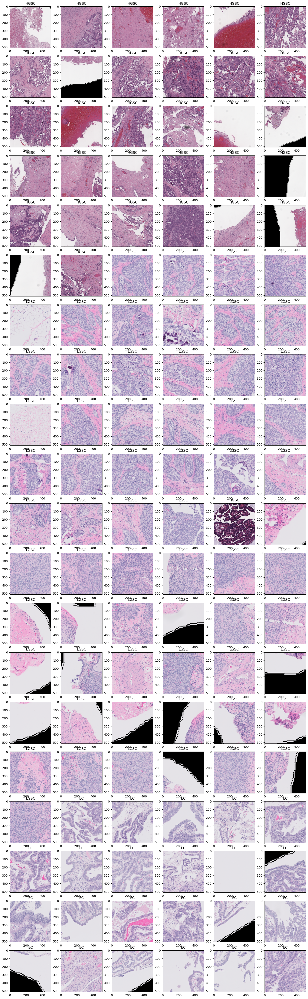

In [6]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tiles_df_sample.iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title(row['label'])
    ax.imshow(img)